# **Bag-of-visual-words for Image Classification**

**Steps:**

*   Load and quantize image features;                
*   Represent images by histograms of quantized features;
*   Classify images with nearest neighbor (NN)/k-NN/SVM classifiers.             


In [1]:
%%capture
!pip uninstall opencv-python -y
# Change OpenCV version since patented and experimental algorithms
# are contained in the opencv_contrib package
!pip install opencv-contrib-python --force-reinstall

In [2]:
# Import images from a zip file
%%capture
!unzip 4_ObjectCategories.zip
# !unzip 15_ObjectCategories.zip

In [3]:
import os
import cv2
import sklearn
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

* Import images (for each label select 30 images for training and 50 for testing).

In [4]:
# Load images
print("Loading images...\n")
images_folder = './4_ObjectCategories'
# images_folder = './15_ObjectCategories'

# List of training images per label 
train_images = []
# List of testing images per label 
test_images = []

# Order labels by name
labels = sorted(os.listdir(images_folder))

n = 0
# For each label
for label in labels:
  images_path = os.path.join(images_folder, label)
  # Select a subset of images (30 for training and 50 for testing)
  n_train = 30
  n_test = 50 if len(os.listdir(images_path)) >= 80 else len(os.listdir(images_path)) - n_train
  idx_train_test = np.random.choice(len(os.listdir(images_path)), n_train + n_test, replace=False)
  train_files = [os.listdir(images_path)[idx] for idx in idx_train_test[:n_train]]
  test_files = [os.listdir(images_path)[idx] for idx in idx_train_test[n_train:]]
  
  # List of images
  images_per_label = []
  print(f"Loading training images ({label})...")
  # For each image with label 'image_label'
  for image in train_files:
      img_path = os.path.join(images_path, image)
      # Convert images to RGB format
      img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
      # Append image to the current label list
      images_per_label.append(img)
      n += 1
  # Add current list of images to the train_images list
  train_images.append(images_per_label)

  # List of images
  images_per_label = []
  print(f"Loading testing images ({label})...")
  # For each image with label 'image_label'
  for image in test_files:
      img_path = os.path.join(images_path, image)
      # Convert images to RGB format
      img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
      # Append image to the current label list
      images_per_label.append(img)
      n += 1
  # Add current list of images to the train_images list
  test_images.append(images_per_label)

print(f"\n{n} images loaded!")
print(f"\nNumber of labels: {len(labels)}")
print("\nNumber of images per label:")
for idx in range(len(labels)):
  print(f"{labels[idx]}: train ({len(train_images[idx])}) - test ({len(test_images[idx])})")

Loading images...

Loading training images (airplanes)...
Loading testing images (airplanes)...
Loading training images (cars)...
Loading testing images (cars)...
Loading training images (faces)...
Loading testing images (faces)...
Loading training images (motorbikes)...
Loading testing images (motorbikes)...

320 images loaded!

Number of labels: 4

Number of images per label:
airplanes: train (30) - test (50)
cars: train (30) - test (50)
faces: train (30) - test (50)
motorbikes: train (30) - test (50)


In [5]:
# Create train labels vector
train_labels = []
for label in range(len(train_images)):
  for idx_image in range(len(train_images[label])):
    train_labels.append([label])
train_labels = np.concatenate(train_labels)
print(f"Train labels shape: {train_labels.shape}")

# Create test labels vector
test_labels = []
for label in range(len(test_images)):
  for idx_image in range(len(test_images[label])):
    test_labels.append([label])
test_labels = np.concatenate(test_labels)
print(f"Test labels shape: {test_labels.shape}")

Train labels shape: (120,)
Test labels shape: (200,)


*  Detect train/test keypoints/descriptors using the SIFT algorithm.

In [6]:
# Create SIFT object
DENSE = False
#sift = cv2.xfeatures2d.SIFT_create(sigma=0.5, contrastThreshold=0.001)
sift = cv2.xfeatures2d.SIFT_create(sigma=0.5, contrastThreshold=0.005)

In [7]:
train_keypoints = []
train_descriptors = []

# Define two masks. 'label_mask' associates each descriptor to the corresponding label ID
# while 'image_mask' associates each descriptor to the corresponding image ID
label_mask_train = []
image_mask_train = []

# Extract SIFT features from training images
for idx_label, list_images in enumerate(train_images):
  # For each label
  label_kps = []
  label_des = []
  print(f"Processing training '{labels[idx_label]}' images...")
  for idx_image, image in enumerate(list_images):
    # Apply SIFT algorithm
    if DENSE:
      kps, des = DenseSIFT(sift, 5, 5).detectAndCompute(image)
    else:
      kps, des = sift.detectAndCompute(image, None)
    label_kps.append(kps)
    label_des.append(des)
    label_mask_train.append(np.full(shape=(len(kps)), fill_value=idx_label))
    image_mask_train.append(np.full(shape=(len(kps)), fill_value=idx_image))

  train_keypoints.append(label_kps)
  train_descriptors.append(label_des)

label_mask_train = np.concatenate(label_mask_train)
image_mask_train = np.concatenate(image_mask_train)

Processing training 'airplanes' images...
Processing training 'cars' images...
Processing training 'faces' images...
Processing training 'motorbikes' images...


In [8]:
print(f"Total number of training keypoints/descriptors: {label_mask_train.shape[0]}")

Total number of training keypoints/descriptors: 739715


In [9]:
test_keypoints = []
test_descriptors = []

# Define two masks. 'label_mask' associates each descriptor the the corresponding label ID
# while 'image_mask' associates each descriptor to the corresponding image ID
label_mask_test = []
image_mask_test = []

# Extract SIFT features from training images
for idx_label, list_images in enumerate(test_images):
  # For each label
  label_kps = []
  label_des = []
  print(f"Processing testing '{labels[idx_label]}' images...")
  for idx_image, image in enumerate(list_images):
    # Apply SIFT algorithm
    if DENSE:
      kps, des = DenseSIFT(sift, 5, 5).detectAndCompute(image)
    else:
      kps, des = sift.detectAndCompute(image, None)
    label_kps.append(kps)
    label_des.append(des)
    label_mask_test.append(np.full(shape=(len(kps)), fill_value=idx_label))
    image_mask_test.append(np.full(shape=(len(kps)), fill_value=idx_image))

  test_keypoints.append(label_kps)
  test_descriptors.append(label_des)

label_mask_test = np.concatenate(label_mask_test)
image_mask_test = np.concatenate(image_mask_test)

Processing testing 'airplanes' images...
Processing testing 'cars' images...
Processing testing 'faces' images...
Processing testing 'motorbikes' images...


In [10]:
print(f"Total number testing of keypoints/descriptors: {label_mask_test.shape[0]}")

Total number testing of keypoints/descriptors: 1242148


*  Plot keypoints of a random train image for each label.

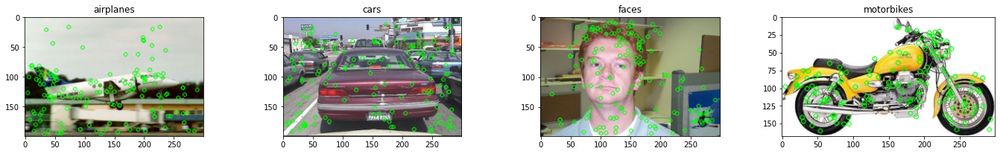

In [11]:
# Plot keypoints
_ = plt.figure(figsize=(30,10))
for idx_label in range(len(labels)):
  # Extract random image
  idx_image = np.random.randint(0, len(train_images[idx_label]))
  img = train_images[idx_label][idx_image]
  # Get keypoints
  kps = train_keypoints[idx_label][idx_image]
  kps_idx = np.random.choice(len(kps), 150, replace=False)
  kps = [kps[idx] for idx in kps_idx]
  _ = plt.subplot(3, 5, idx_label+1), plt.imshow(cv2.drawKeypoints(img, kps, None, color=(0,255,0))), plt.title(f"{labels[idx_label]}")

*  K-Means clustering

Clustering of training descriptors in order to obtain our 'visual' words. We apply the K-Means algorithm considering a fixed number of 'visual' words (e.g., 500). To reduce the amount of time for clustering thousands of descriptors, we can select a subset of descriptors (e.g., 40,000).

In [12]:
# Create a matrix containing all training descriptors
train_des = []
for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    train_des.append(train_descriptors[idx_label][idx_image])
train_des = np.concatenate(train_des) # [total_num_descriptors x 128]
print(f"Training descriptors: {train_des.shape}")   

# Create a matrix containing all testing descriptors
test_des = []
for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    test_des.append(test_descriptors[idx_label][idx_image])
test_des = np.concatenate(test_des) # [total_num_descriptors x 128]
print(f"Testing descriptors: {test_des.shape}")

Training descriptors: (739715, 128)
Testing descriptors: (1242148, 128)


In [13]:
# Create a matrix containing all training keypoints
train_kps = []
for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    train_kps.append(train_keypoints[idx_label][idx_image])
train_kps = np.concatenate(train_kps) # [total_num_keypoints x 128]
print(f"Training keypoints: {train_kps.shape}")   

# Create a matrix containing all testing keypoints
test_kps = []
for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    test_kps.append(test_keypoints[idx_label][idx_image])
test_kps = np.concatenate(test_kps) # [total_num_keypoints x 128]
print(f"Testing keypoints: {test_kps.shape}")

Training keypoints: (739715,)
Testing keypoints: (1242148,)


In [14]:
# Select randomly 40,000 descriptors
n_descriptors = 40000 if train_des.shape[0] >= 40000 else train_des.shape[0]
rand_descriptors_idx = np.random.choice(train_des.shape[0], n_descriptors, replace=False)
k_means_input = train_des[rand_descriptors_idx]
print(f"Total number of selected training descriptors: {k_means_input.shape[0]}.")

Total number of selected training descriptors: 40000.



*  How	to	choose the vocabulary size?


In [15]:
# Build visual vocabulary by k-means clustering (and feature assignment).
print("K-Means clustering...")
n_visual_words = 500
kmeans = KMeans(n_clusters=n_visual_words, max_iter=50).fit(k_means_input)
# Two important attributs of k-means fitted estimator are 'kmeans.cluster_centers_' (coordinates of cluster centers)
# and 'kmeans.labels_' (labels of each point)
visual_words = kmeans.cluster_centers_
print(f"Visual words (shape): {visual_words.shape}")

K-Means clustering...
Visual words (shape): (500, 128)


# Ex. 1

Select (randomly) a visual word and visualize all the associated patches. 

**Steps**:

*   Fix size of retrieved patches (e.g., 30x30 pixels);
*   Fix a visual word index (e.g., visual word n. 5);
*   Select the decriptors associated to the 5-th visual word (consider only the descriptors used as inputs to the K-Means clustering algorithm);
*   Retrieve the keypoints associated to the selected descriptors;
*   Extract a squared patch around the selected keypoints;
*   Plot all the extracted patches for the 5-th visual word.

Repeat the above steps for five randomly selected visual words.


Visual word n. 174 (68 patches)


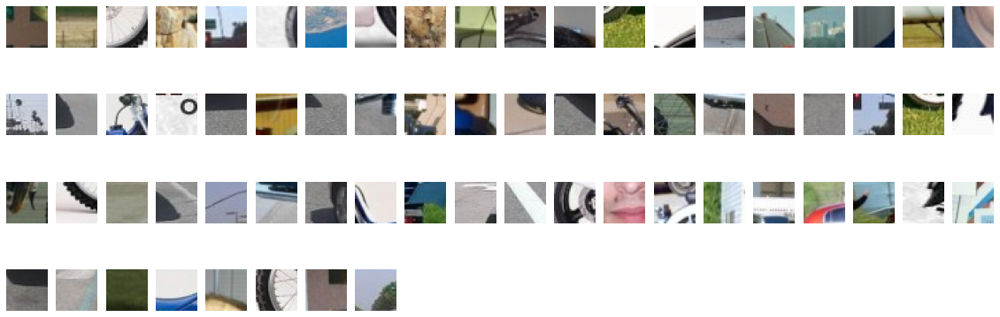


Visual word n. 44 (76 patches)


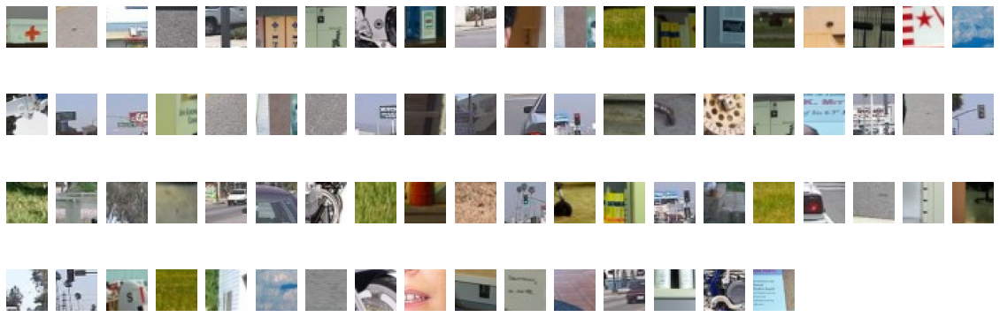


Visual word n. 135 (42 patches)


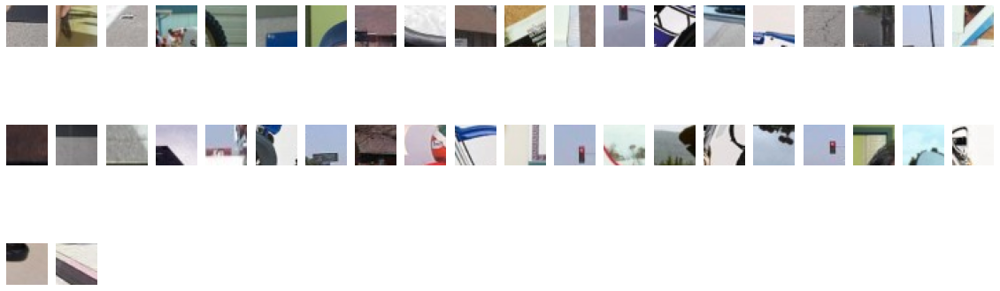


Visual word n. 460 (42 patches)


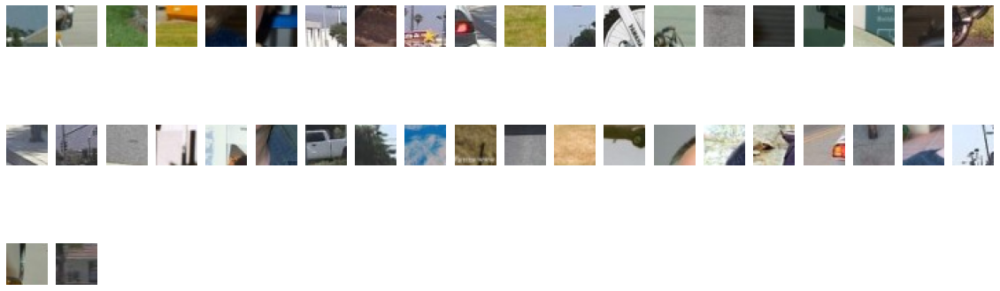


Visual word n. 266 (68 patches)


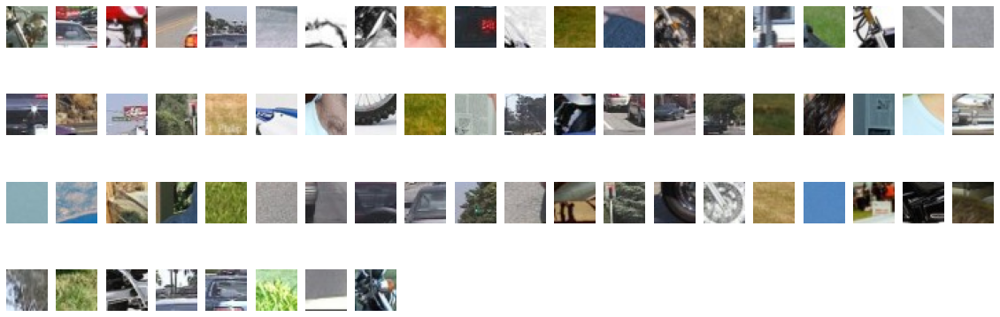

In [16]:
# Patch size
patch_size = (30,30) # (width, height)

# Randomly select a visual word index
for idx_visual_word in np.random.choice(n_visual_words, 5, replace=False):
  # List of extracted patches
  patches = []

  # Select keypoints/descriptors' indices 
  idx_des = rand_descriptors_idx[kmeans.labels_ == idx_visual_word] # Indices des/kps associated to the 'idx_visual_word' visual word.

  # Retrieve idx labels
  idx_labels = label_mask_train[idx_des]
  # Retrieve idx images
  idx_images = image_mask_train[idx_des] 

  # For each descriptor
  for i in range(len(idx_labels)):
    # Retrieve keypoint
    kp = train_kps[idx_des[i]]

    # Retrieve keypoint's position
    points2f_kp	=	cv2.KeyPoint_convert([kp]).astype(int)[0]

    # Select associated image
    label = idx_labels[i]
    n_image = idx_images[i]
    img = train_images[label][n_image]

    # Extract a squared patch around the keypoint
    row_start = points2f_kp[1] - (patch_size[1]//2) if points2f_kp[1] - (patch_size[1]//2) >= 0 else 0
    row_end = points2f_kp[1] + (patch_size[1]//2) if points2f_kp[1] + (patch_size[1]//2) <= img.shape[0] else img.shape[0]

    col_start = points2f_kp[0] - (patch_size[0]//2) if points2f_kp[0] - (patch_size[0]//2) >= 0 else 0
    col_end = points2f_kp[0] + (patch_size[0]//2) if points2f_kp[0] + (patch_size[0]//2) <= img.shape[1] else img.shape[1]
    
    patches.append(cv2.resize(img[row_start:row_end, col_start:col_end], dsize=patch_size))

  # Plot cropped regions
  print(f"\nVisual word n. {idx_visual_word} ({len(idx_labels)} patches)")
  fig = plt.figure(figsize=(20, 7))
  for i in range(len(patches)):
    plt.subplot(np.ceil(len(patches)/20), 20, i+1), plt.imshow(patches[i]), plt.axis('off') # Plot 20 patches per row
  plt.show()

# Ex. 2 

* **Feature Quantization**:	assign each feature	to	the	most representative visual word.

Implement the 'hard' assignment procedure which consists in associating each descriptor to the closest visual word. Perform this procedure for both training and testing descriptors. Create two lists (train_des_labels and test_des_labels) which associate to each descriptor the corresponding visual word.

**Steps**:
*  Compute Euclidean distances between each training descriptor and each visual word.
*  Detect the closest visual word to each decriptor.

In [17]:
train_des_labels = []
test_des_labels = []

# Compute pairwise distance matrix
train_distances = sklearn.metrics.pairwise_distances(train_des, visual_words)
# Find the closest visual word to each training descriptor
train_des_labels = np.argmin(train_distances, axis=1)

# Compute pairwise distance matrix
test_distances = sklearn.metrics.pairwise_distances(test_des, visual_words)
# Find the closest visual word to each testing descriptor
test_des_labels = np.argmin(test_distances, axis=1)

print(f"train_des_labels shape: {train_des_labels.shape}")
print(f"test_des_labels shape: {test_des_labels.shape}")

train_des_labels shape: (739715,)
test_des_labels shape: (1242148,)


# **Ex. 3**
Compute the histogram of visual words for each of the training images which will be used to train a classifier. The output should be in the same format as 'train_images'/'test_images' variables (i.e., a list of lists where the first index represents the label while the second one represents the image index.)

Repeat the same procedure to extract the histograms of visual words for the testing images. 

* Use the following variables' names: 'bovw_train' and 'bovw_test'.

In [18]:
bovw_train = []

# Loop over training labels
for label in range(len(train_images)):
  # Loop over images
  bovw_train_label = []
  for idx_image in range(len(train_images[label])):
    # Select descriptors associated to the image
    mask = np.logical_and(label_mask_train == label, image_mask_train == idx_image)
    
    # Retrieve labels of visual words associated to the selected descriptors
    sel_des_labels = train_des_labels[mask]

    # Create histogram of visual words
    h = np.histogram(sel_des_labels, bins=n_visual_words)[0].reshape(1, -1)

    # Save current bovw
    bovw_train_label.append(h)
  
  # Save list of bovw(s)
  bovw_train.append(bovw_train_label)

print(f"len(bovw_train): {len(bovw_train)}")
for label in range(len(bovw_train)):
  print(f"len(bovw_train[{label}]): {len(bovw_train[label])}")

len(bovw_train): 4
len(bovw_train[0]): 30
len(bovw_train[1]): 30
len(bovw_train[2]): 30
len(bovw_train[3]): 30


In [19]:
bovw_test = []

# Loop over training labels
for label in range(len(test_images)):
  # Loop over images
  bovw_test_label = []
  for idx_image in range(len(test_images[label])):
    # Select descriptors associated to the image
    mask = np.logical_and(label_mask_test == label, image_mask_test == idx_image)
    
    # Retrieve labels of visual words associated to the selected descriptors
    sel_des_labels = test_des_labels[mask]
    
    # Create histogram of visual words
    h = np.histogram(sel_des_labels, bins=n_visual_words)[0].reshape(1, -1)

    # Save current bovw
    bovw_test_label.append(h)
  # Save list of bovw(s)
  bovw_test.append(bovw_test_label)

print(f"len(bovw_test): {len(bovw_test)}")
for label in range(len(bovw_test)):
  print(f"len(bovw_test[{label}]): {len(bovw_test[label])}")

len(bovw_test): 4
len(bovw_test[0]): 50
len(bovw_test[1]): 50
len(bovw_test[2]): 50
len(bovw_test[3]): 50


*   Feature scaling (normalize histograms w.r.t. L1-norm).

In [20]:
# Feature scaling train images
bovw_train_unscaled = bovw_train
for label in range(len(bovw_train)):
  for idx_image in range(len(bovw_train[label])):
    h = bovw_train[label][idx_image]
    bovw_train[label][idx_image] = h / h.sum()

# Feature scaling test images
bovw_test_unscaled = bovw_test
for label in range(len(bovw_test)):
  for idx_image in range(len(bovw_test[label])):
    h = bovw_test[label][idx_image]
    bovw_test[label][idx_image] = h / h.sum()

print("Feature scaling completed!")

Feature scaling completed!


Plot of the histograms of visual words of one random training image associated to each label.

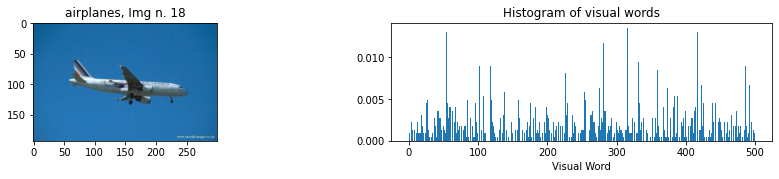

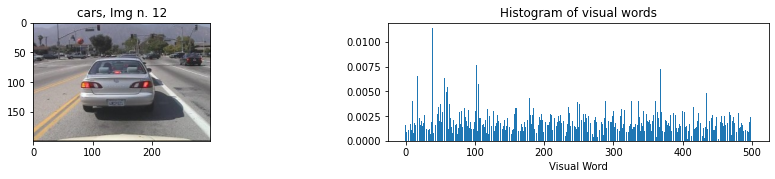

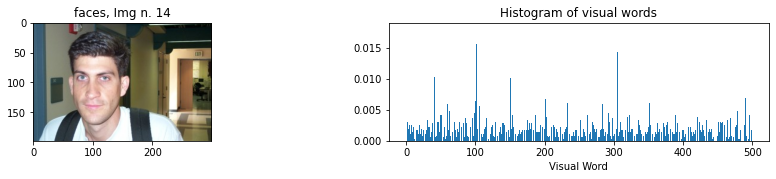

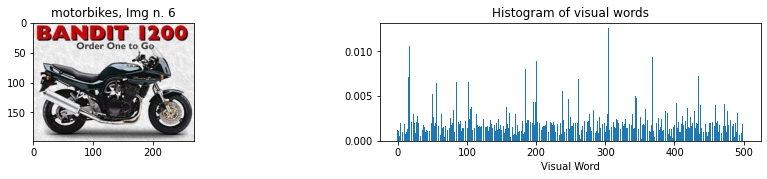

In [21]:
i = 0
for idx_label in range(len(train_images)):
  
  # Select random image 
  idx_img = np.random.randint(0, len(train_images[idx_label]))
  
  # Retrieve image
  img = train_images[idx_label][idx_img]

  # Retrieve bag-of-visual-words for the selected image
  h = bovw_train[idx_label][idx_img]
  
  _ = plt.figure(figsize=(15, 10))
  _ = plt.subplot(len(labels),2,i+1), plt.imshow(img), plt.title(f"{labels[idx_label]}, Img n. {idx_img}")
  _ = plt.subplot(len(labels),2,i+2), plt.bar(np.arange(n_visual_words), h.reshape(-1)), plt.title("Histogram of visual words"), plt.xlabel('Visual Word') 
  i += 2

**Learn category models/classifiers	from	a	training	set**

Discriminative	methods:

*  k-NN;

*  SVM:	linear	and	non-linear	kernels	(RBF,	Intersection,	…).	

Generative	methods:

*  Graphical models	(pLSA,	LDA,	…).


# Ex. 4
Implement the nearest neighbour classifier to classify test images. 

**Steps:**
*   Compute pairwise Euclidean distances between each test and train histograms;

*   Compute the closest train histogram to each test histogram;

*   Retrieve the labels of the associated train histograms;

*   Compute accuracy, precision and recall. Hint: these metrics can be computed using the confusion matrix provided by the 'sklearn.metrics.confusion_matrix()' function 

(sklearn.metrics.confusion_matrix(y_true, y_pred, *, labels=None, sample_weight=None, normalize=None)). 

In [22]:
# Matrix of bovw(s)
bovw_train_mat = []
bovw_test_mat = []

for idx_label in range(len(train_images)):
  for idx_image in range(len(train_images[idx_label])):
    bovw_train_mat.append(bovw_train[idx_label][idx_image])
bovw_train_mat = np.concatenate(bovw_train_mat)

for idx_label in range(len(test_images)):
  for idx_image in range(len(test_images[idx_label])):
    bovw_test_mat.append(bovw_test[idx_label][idx_image])
bovw_test_mat = np.concatenate(bovw_test_mat)

print(f"bovw_train_mat shape: {bovw_train_mat.shape}")
print(f"bovw_test_mat shape: {bovw_test_mat.shape}")


bovw_train_mat shape: (120, 500)
bovw_test_mat shape: (200, 500)


In [23]:
# Compute pairwise distances
dist_matrix_l2 = sklearn.metrics.pairwise_distances(bovw_test_mat, bovw_train_mat)
# Compute closest train histogram
closest_bovw = np.argmin(dist_matrix_l2, axis=1)
# Retrieve corresponding label
predictions = train_labels[closest_bovw]

In [24]:
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)
print(confusion_matrix)

[[26 14  5  5]
 [ 0 44  0  6]
 [ 3  4 39  4]
 [ 1 10  3 36]]


In [25]:
accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** NN image classification (L2) ****")
print(f"Accuracy: {np.mean(accuracy)}")
print(f"Precision: {np.mean(precision)}")
print(f"Recall: {np.mean(recall)}")

**** NN image classification (L2) ****
Accuracy: 0.725
Precision: 0.7533618411903769
Recall: 0.7249999999999999


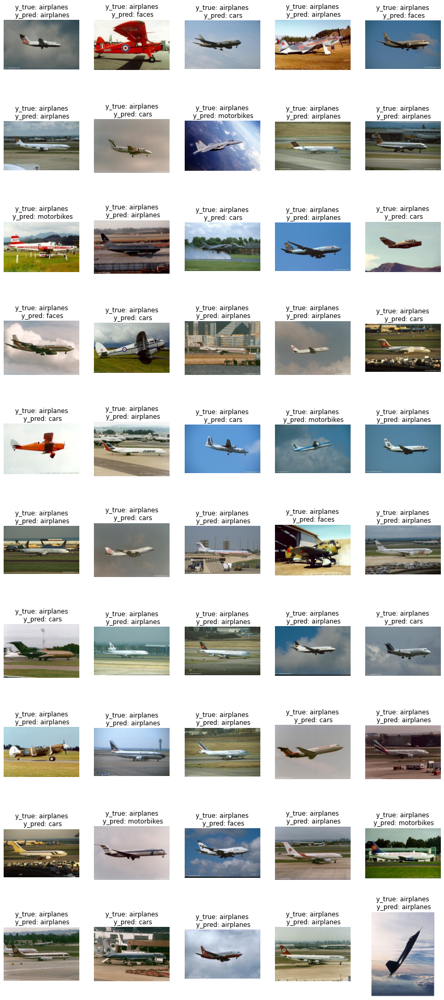

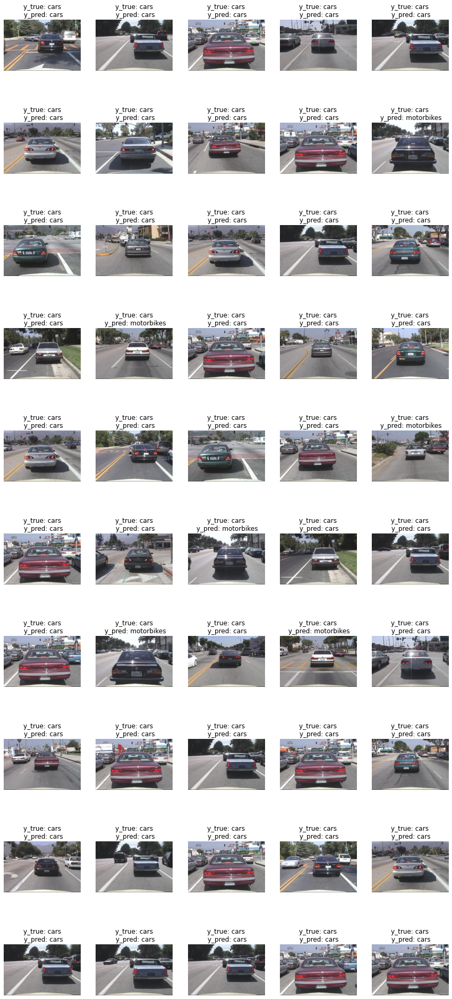

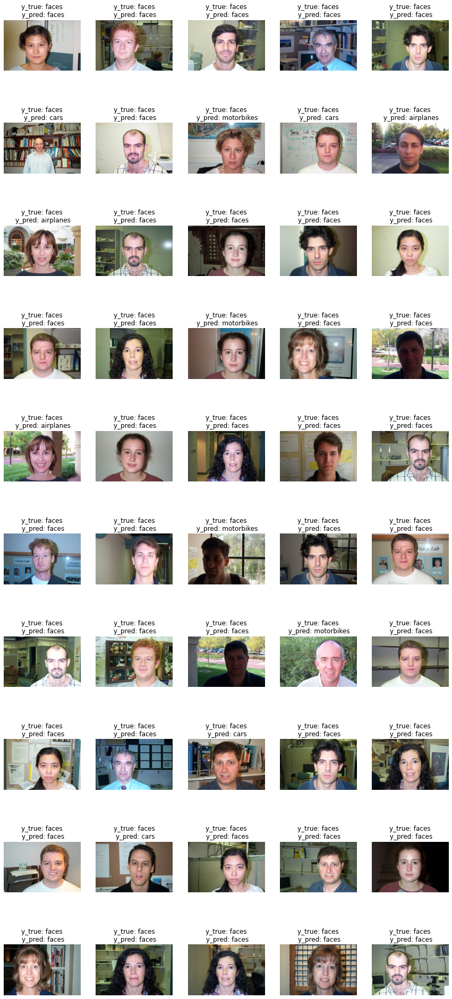

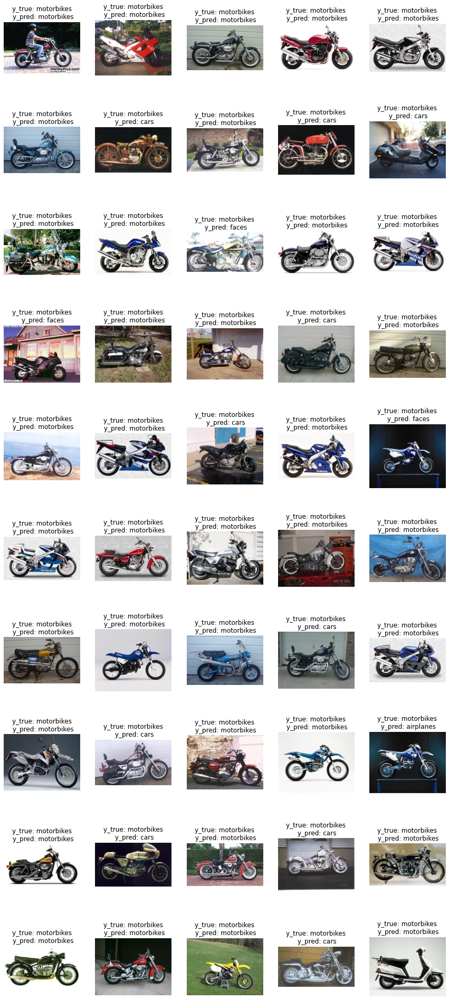

In [26]:
i = 0
for label in range(len(test_images)):
  fig = plt.figure(figsize=(15, 35))
  fig.subplots_adjust(hspace=.2)
  p = 0
  for idx_image in range(len(test_images[label])):
    img = test_images[label][idx_image]    
    plt.subplot(np.ceil(len(test_images[label])/5), 5, p+1)
    plt.gca().set_title(f"y_true: {labels[test_labels[i]]}\n y_pred: {labels[predictions[i]]}")
    plt.imshow(img)
    plt.axis('off')
    i, p = i+1, p+1

# **Ex. 3.1** 

Repeat Nearest Neighbor image classification using Chi2 distance instead of L2. Chi-2 distance is defined as follows:

$~~~~~~~~~~~~X^2 = \frac{1}{2}\sum_{i=1}^n \frac{(x_i-y_i)^2}{(x_i+y_i)}$

In [27]:
# Function to calculate Chi-distance
def chi2_distance(A, B):
  eps = float_epsilon = np.finfo(float).eps
  A = A / (A.sum() + eps)
  B = B / (B.sum() + eps)
  # compute the chi-squared distance using above formula
  chi2_dist = 0.5 * np.sum([((a - b) ** 2) / (a + b + eps) 
                      for (a, b) in zip(A, B)])
  return chi2_dist

In [28]:
# Compute pairwise distances
dist_matrix_chi2 = sklearn.metrics.pairwise_distances(bovw_test_mat, bovw_train_mat, metric=chi2_distance)
# Compute closest train histogram
closest_bovw = np.argmin(dist_matrix_chi2, axis=1)
# Retrieve corresponding label
predictions = train_labels[closest_bovw]

In [29]:
confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)
print(confusion_matrix)

[[23 16  4  7]
 [ 0 45  0  5]
 [ 2  3 38  7]
 [ 1 13  1 35]]


In [30]:
accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** NN image classification (chi2) ****")
print(f"Accuracy: {np.mean(accuracy)}")
print(f"Precision: {np.mean(precision)}")
print(f"Recall: {np.mean(recall)}")

**** NN image classification (chi2) ****
Accuracy: 0.705
Precision: 0.7502250118529188
Recall: 0.7050000000000001


# **Ex. 4**

Implement a K-NN classifier using different values for the parameter k (e.g., 3) and compute the correponding accuracy, precision and recall. In this case, the k closest train histograms must be associated to each test histogram and the 'winner' selected using a majority voting procedure.

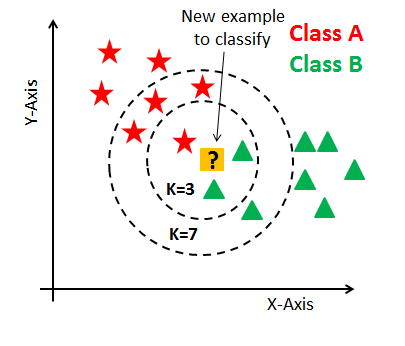

In [31]:
k = 3  # Extract the k closest train histograms for each test histogram
closest_bovw = np.argpartition(dist_matrix_l2, kth=k, axis=1)[:, :k]
# Retrieve  corresponding labels
k_predictions = train_labels[closest_bovw]

predictions = []
for i in range(k_predictions.shape[0]):
  pred_i = k_predictions[i]
  # Majority voting
  counts = np.bincount(pred_i)
  predictions.append(np.argmax(counts))
predictions = np.asarray(predictions)

confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** k-NN image classification (k = {k}, L2) ****")
print(f"Accuracy: {np.mean(accuracy):.2f}")
print(f"Precision: {np.mean(precision):.2f}")
print(f"Recall: {np.mean(recall):.2f}\n")

**** k-NN image classification (k = 3, L2) ****
Accuracy: 0.68
Precision: 0.70
Recall: 0.68



# **Ex. 4.1**

Repeat k-NN image classification using Chi2 distance instead of L2.

In [32]:
k = 3
# Compute k closest train histograms for each test histogram
closest_bovw = np.argpartition(dist_matrix_chi2, kth=k, axis=1)[:, :k]
# Retrieve  corresponding labels
k_predictions = train_labels[closest_bovw]

predictions = []
for i in range(k_predictions.shape[0]):
  pred_i = k_predictions[i]
  # Majority voting
  counts = np.bincount(pred_i)
  predictions.append(np.argmax(counts))
predictions = np.asarray(predictions)

confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** k-NN image classification (k = {k}, chi2) ****")
print(f"Accuracy: {np.mean(accuracy):.2f}")
print(f"Precision: {np.mean(precision):.2f}")
print(f"Recall: {np.mean(recall):.2f}\n")

**** k-NN image classification (k = 3, chi2) ****
Accuracy: 0.66
Precision: 0.69
Recall: 0.66



*   C-Support Vector Classification

In [33]:
# Train SVM classifier
from sklearn import svm
clf = svm.SVC(kernel='rbf')
clf.fit(bovw_train_mat, train_labels)
predictions = clf.predict(bovw_test_mat)

confusion_matrix = sklearn.metrics.confusion_matrix(test_labels, predictions)

accuracy = np.sum(np.diag(confusion_matrix)) / confusion_matrix.sum()
precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 0)
recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis = 1)
print(f"**** C-Support Vector Classification ****")
print(f"Accuracy: {np.mean(accuracy):.2f}")
print(f"Precision: {np.mean(precision):.2f}")
print(f"Recall: {np.mean(recall):.2f}\n")

**** C-Support Vector Classification ****
Accuracy: 0.81
Precision: 0.83
Recall: 0.81



# **Ex. 5** (Optional)

Implement a dense version of the SIFT algorithm and compare your results with the previous outputs.

**Steps:**

*  Define step_size and feature_scale (e.g., step_size=5, feature_scale=5);
*  Create a grid for the input image using the above parameters;
*  Create a list of keypoints using the method 'cv2.Keypoint()'. As input parameters use x and y coordinates of each point of the grid and size of the keypoint (feature_scale paramater);
*  Use the sift.Compute() method to compute the descriptors associated to the keypoints previously created. As input parameters use the image and the list of keypoints;
*  Compute accuracy, precision and recall using the above descriptors for all the classifiers.

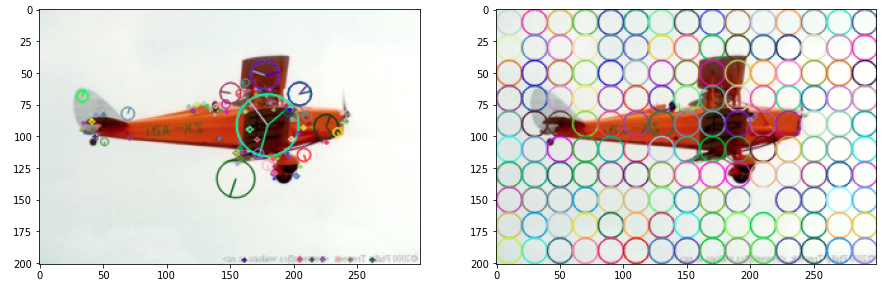

In [34]:
class DenseSIFT(): 
  '''
  Dense SIFT class implementation. 
  It return detected keypoints and descriptors.

  Note: run this cell before extracting the dense features.
  '''

  def __init__(self, detector, step_size=20, feature_scale=20): 
      self.detector = detector
      self.step_size = step_size
      self.feature_scale = feature_scale
    
  def detectAndCompute(self, img):
      keypoints = []
      rows, cols = img.shape[:2]
      for x in range(self.feature_scale//2, cols, self.step_size):
          for y in range(self.feature_scale//2, rows, self.step_size):
              keypoints.append(cv2.KeyPoint(float(x), float(y), self.feature_scale))
      kps, des = sift.compute(img, keypoints) 
      return kps, des

Dense SIFT results:

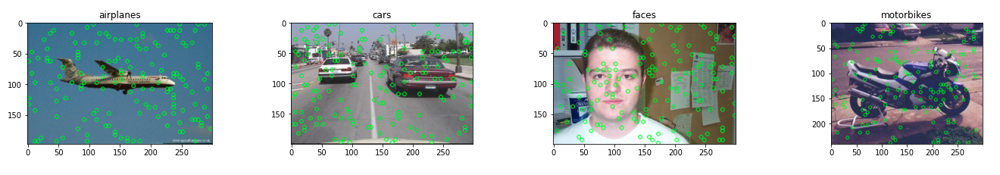

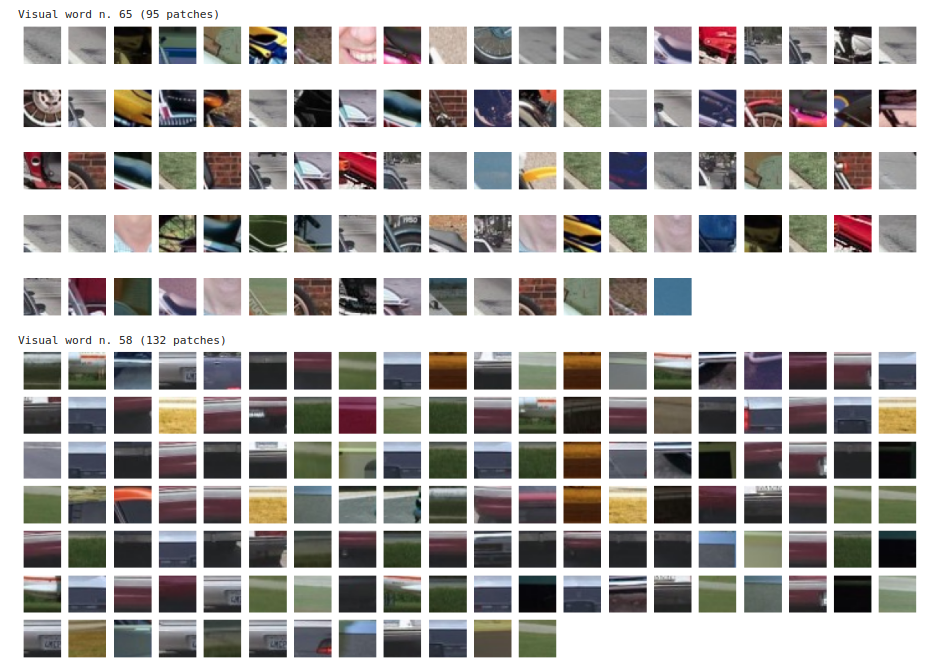

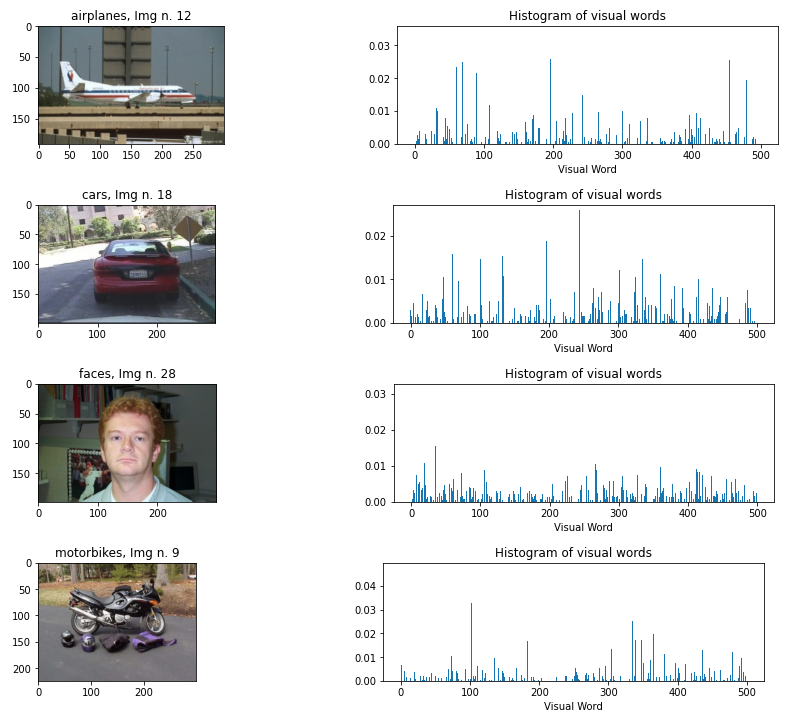

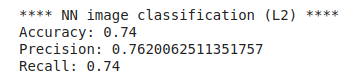

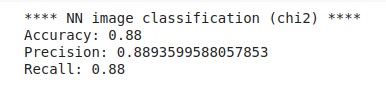

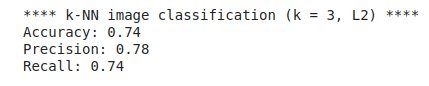

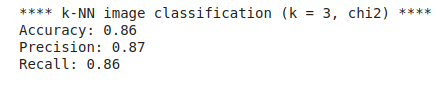

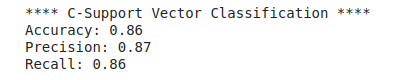

*   To apply the BOW pipeline to the dataset containing 15 classes, load the '15_ObjectCategories.zip' file and use ``` !unzip 15_ObjectCategories.zip ``` and ``` images_folder = './15_ObjectCategories' ```. 

15_ObjectCategories dataset (DenseSIFT) results:


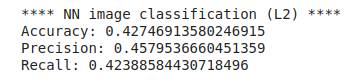

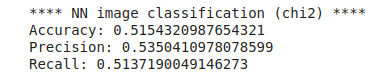

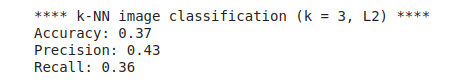

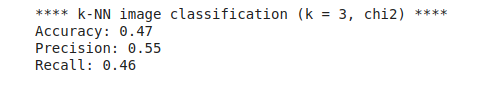

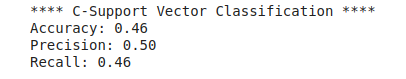